https://github.com/mas178/Inaba2024/blob/d1a5dda1310e5de07e7bc2884e45de44873cc034/src/Simulation.jl
を再現する → 再現できた。

- (0.0, 0.0), (0.1, 0.1) のときは50%前後の協力率
- (0.8, 0.8), (0.9, 0.9) のときは70%以上の協力率

人口変動をよりシンプルにする。→ Exp003

In [1]:
using DataFrames: DataFrame, nrow, dropmissing, select!, Not
using Graphs: SimpleGraph, degree, gdistances, local_clustering_coefficient, connected_components
using LinearAlgebra
using Random: MersenneTwister
using StatsBase: mean, std, sample, Weights
using Plots: plot, plot!, Plot

Threads.nthreads()

12

In [32]:
"""
    ar1(β::Float64, σ::Float64, μ::Float64, T::Int, rng::MersenneTwister)::Vector{Float64}

AR(1) Model to create environmental volatility.
"""
function ar1(
    β::Float64,        # 自己回帰の係数。|β| < 1 の場合に平均回帰性を持つ。μ = α / (1 - β)
    sigma::Float64,        # std of white noise
    μ::Float64,        # expected average value
    T::Int,            # time steps
    rng::MersenneTwister,
)::Vector{Float64}
    @assert 0 < μ < 2

    variation = min(2.0 - μ, μ)
    ceiling = μ + variation
    floor = μ - variation
    alpha = μ * (1 - β)    # 定数項。μから逆算する。

    x = Vector{Float64}(undef, T + 1)
    x[1] = μ

    for t = 1:T
        ϵ = sigma * randn(rng)  # white noise
        x[t + 1] = clamp(alpha + β * x[t] + ϵ, floor, ceiling)
    end

    return x
end

β = 0.8
σ = 0.8
T = 1_000
env_severity_vec = ar1(β, σ, 1.0, T, MersenneTwister())
death_rate_vec = env_severity_vec .* 0.1
@show mean(env_severity_vec)
@show mean(death_rate_vec)

N = 10_000
N_vec = fill(0.0, T)
for t in 1:T
    N_vec[t] = N = N - N * death_rate_vec[t] + N * 0.1
end

@show maximum(N_vec), mean(N_vec), minimum(N_vec);

mean(env_severity_vec) = 0.9220141084670992
mean(death_rate_vec) = 0.09220141084670988
(maximum(N_vec), mean(N_vec), minimum(N_vec)) = (3.3052160904532233e6, 274685.0059708131, 6153.447817842689)


In [2]:
@enum Strategy C D

invert(s::Strategy)::Strategy = (s == C ? D : C)

@kwdef struct Param
    initial_N::Int = 1_000
    T::Float64 = 1.1                         # Temptation payoff
    S::Float64 = -0.1                        # Sucker's payoff
    initial_graph_weight::Float64 = 0.2
    relationship_volatility::Float64 = 0.1
    reproduction_rate::Float64 = 0.1
    δ::Float64 = 1.0                         # strength of selection
    μ::Float64 = 0.01                        # mutation rate
    β::Float64 = 0.1                         # environmental volatility (自己回帰の係数)
    σ::Float64 = 0.1                         # environmental volatility (std of white noise)
    generations::Int = 2_000                 # generations (Time steps)
    trial_max::Int = 10                      # trial count
    rng::MersenneTwister = MersenneTwister() # random seed
end

mutable struct Model
    N::Int                             # agents' population
    strategy_vec::Vector{Strategy}     # agents' strategy
    payoff_vec::Vector{Float64}        # agents' payoff
    graph_weights::Matrix{Float16}     # agents' relationship
    payoff_table::Union{Dict{Tuple{Strategy,Strategy},Tuple{Float64,Float64}},Nothing}
    death_rate_vec::Union{Vector{Float64},Nothing}
    param::Param

    function Model(p::Param)
        env_severity_vec = ar1(p.β, p.σ, 1.0, round(Int, p.generations / 10), p.rng)
        death_rate_vec = Vector{Float64}(undef, p.generations)

        for g = 1:(p.generations)
            env_severity = env_severity_vec[ceil(Int, g / 10)]
            death_rate_vec[g] = env_severity * p.reproduction_rate
        end

        new(
            p.initial_N,
            fill(D, p.initial_N),
            fill(0.0, p.initial_N),
            (fill(1.0, (p.initial_N, p.initial_N)) - Matrix(I, p.initial_N, p.initial_N)) * p.initial_graph_weight,
            Dict((C, C) => (1.0, 1.0), (C, D) => (p.S, p.T), (D, C) => (p.T, p.S), (D, D) => (0.0, 0.0)),
            death_rate_vec,
            p,
        )
    end
end

function interaction!(model::Model, generation::Int = -1)::Nothing
    # Reset payoff
    model.payoff_vec .= 0.0

    focal_id_vec = sample(model.param.rng, 1:(model.N), model.N, replace = false)
    all_ids = collect(1:(model.N))
    temp_weights = Vector{Float16}(undef, model.N - 1)
    update_weights = fill(Float16(1.0), (model.N, model.N))

    @inbounds for focal_id in focal_id_vec
        # Pick an opponent
        neighbors = deleteat!(copy(all_ids), focal_id)
        @views temp_weights .= model.graph_weights[focal_id, neighbors]
        opponent_id = sample(model.param.rng, neighbors, Weights(temp_weights))

        strategy_pair = (model.strategy_vec[focal_id], model.strategy_vec[opponent_id])

        # Update payoff
        focal_payoff, opponent_payoff = model.payoff_table[strategy_pair]
        model.payoff_vec[focal_id] += focal_payoff
        model.payoff_vec[opponent_id] += opponent_payoff

        # for updating relationships
        increment = model.param.relationship_volatility * (strategy_pair == (C, C) ? 1 : -1)
        update_weights[focal_id, opponent_id] = update_weights[opponent_id, focal_id] *= (1.0 + increment)
    end

    # Update relationships
    model.graph_weights = min.(model.graph_weights .* update_weights, 1.0)

    return
end

sigmoid_fitness(payoff::Float64, δ::Float64)::Float64 = 1.0 / (1.0 + exp(-δ * payoff))

function pick_deaths(model::Model, n::Int)::Vector{Int}
    neg_fitness_vec = sigmoid_fitness.(-model.payoff_vec, model.param.δ)
    death_id_vec = sample(model.param.rng, 1:(model.N), Weights(neg_fitness_vec), n, replace = false)

    return sort(death_id_vec)
end

function pick_parents(model::Model, n::Int)::Vector{Int}
    fitness_vec = sigmoid_fitness.(model.payoff_vec, model.param.δ)
    parent_id_vec = sample(model.param.rng, 1:(model.N), Weights(fitness_vec), n, replace = false)

    return sort(parent_id_vec)
end

function normalize_graph_weights!(graph_weights::Matrix{Float16}, N::Int, initial_graph_weight::Float64)::Nothing
    initial_graph_weight_sum = N * (N - 1) * initial_graph_weight

    # factor = sum(Float64.(graph_weights))
    factor = 0.0
    @inbounds @simd for weight in graph_weights
        factor += Float64(weight)
    end

    # graph_weights ./= (factor / initial_graph_weight_sum)
    factor = Float16(initial_graph_weight_sum / factor)
    @inbounds @simd for i in eachindex(graph_weights)
        graph_weights[i] *= factor
    end

    return
end

function death_and_birth!(model::Model, generation::Int = -1)::Tuple{Vector{Int},Vector{Int}}
    # number of deaths and births (should be calculated before model.N changed).
    death_rate = model.death_rate_vec === nothing ? model.param.reproduction_rate : model.death_rate_vec[generation]
    n_deaths = round(Int, model.N * death_rate)
    n_births = round(Int, model.N * model.param.reproduction_rate)

    death_id_vec = []
    parent_id_vec = []

    # death
    if model.N - n_deaths > model.param.initial_N / 2
        death_id_vec = pick_deaths(model, n_deaths)
        survived_index = deleteat!(collect(1:(model.N)), death_id_vec)
        deleteat!(model.strategy_vec, death_id_vec)
        deleteat!(model.payoff_vec, death_id_vec)
        model.N -= n_deaths

        # model.graph_weights = model.graph_weights[survived_index, survived_index]
        _new_weights = fill(Float16(0.0), model.N, model.N)
        @inbounds for x = 1:(model.N)
            @simd for y = 1:(model.N)
                _new_weights[x, y] = model.graph_weights[survived_index[x], survived_index[y]]
            end
        end
        model.graph_weights = _new_weights
    end

    # birth
    if model.N + n_births < model.param.initial_N * 2
        parent_id_vec = pick_parents(model, n_births)
        mutation_vec = rand(model.param.rng, n_births) .< model.param.μ

        for i = 1:n_births
            # strategy
            parent_strategy = model.strategy_vec[parent_id_vec[i]]
            parent_strategy = mutation_vec[i] ? invert(parent_strategy) : parent_strategy
            push!(model.strategy_vec, parent_strategy)

            # payoff
            push!(model.payoff_vec, 0.0)
        end

        # relationship
        # model.graph_weights = vcat(model.graph_weights, fill(Float16(0.0), (n_births, model.N)))
        # model.N += n_births
        # model.graph_weights = hcat(model.graph_weights, fill(Float16(0.0), (model.N, n_births)))
        # model.graph_weights[(model.N-n_births+1):end, :] = model.graph_weights[parent_id_vec, :]
        # model.graph_weights[:, (model.N-n_births+1):end] = model.graph_weights[:, parent_id_vec]
        model.N += n_births
        _new_weights = fill(Float16(0.0), (model.N, model.N))
        @inbounds for x = 1:(model.N - n_births)
            @simd for y = 1:(model.N - n_births)
                _new_weights[x, y] = model.graph_weights[x, y]
            end
        end
        @inbounds @simd for i = 1:n_births
            _new_weights[model.N - n_births + i, :] = _new_weights[parent_id_vec[i], :]
            _new_weights[:, model.N - n_births + i] = _new_weights[:, parent_id_vec[i]]
            _new_weights[parent_id_vec[i], model.N - n_births + i] = 1.0
            _new_weights[model.N - n_births + i, parent_id_vec[i]] = 1.0
            _new_weights[model.N - n_births + i, model.N - n_births + i] = 0.0
        end
        model.graph_weights = _new_weights

        normalize_graph_weights!(model.graph_weights, model.N, model.param.initial_graph_weight)
    end

    return death_id_vec, parent_id_vec
end

cooperation_rate(model::Model)::Float64 = sum(model.strategy_vec .== C) / length(model.strategy_vec)

function run_one_step!(model::Model, generation::Int)::Nothing
    interaction!(model)
    death_and_birth!(model, generation)
    return
end

function run(param::Param)::Matrix{Float64}
    cooperation_rate_matrix = fill(0.0, param.generations, param.trial_max)

    for trial in 1:param.trial_max
        model = Model(param)
        model.strategy_vec = rand(model.param.rng, [C, D], model.param.initial_N)
        
        for generation = 1:(model.param.generations)
            run_one_step!(model, generation)
            cooperation_rate_matrix[generation, trial] = cooperation_rate(model)
        end
    end

    return cooperation_rate_matrix
end

function plot_time_series(cooperation_rate_matrix::Matrix{Float64}, title = "")::Plot
    t_max, trial_max = size(cooperation_rate_matrix)

    p = plot(size = (1000, 200), xlim = (0, t_max), xticks = 0:100:t_max, ylim = (0, 1), yticks = 0:0.1:1, legend = false, title = title)
    
    for trial in 1:trial_max
        plot!(cooperation_rate_matrix[:, trial])
    end
    
    plot!(mean(cooperation_rate_matrix, dims=2), lc = :black, lw = 3)
    
    return p
end;

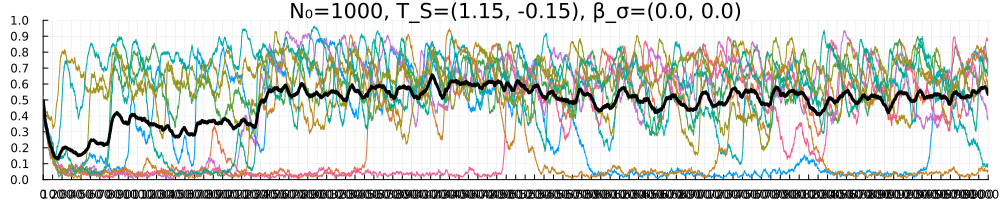

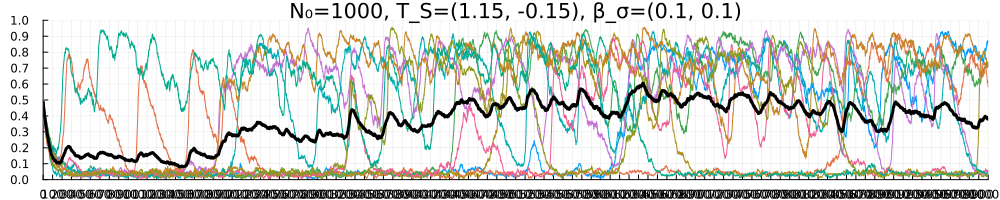

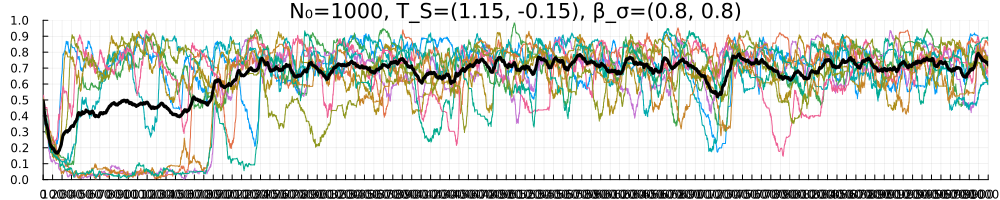

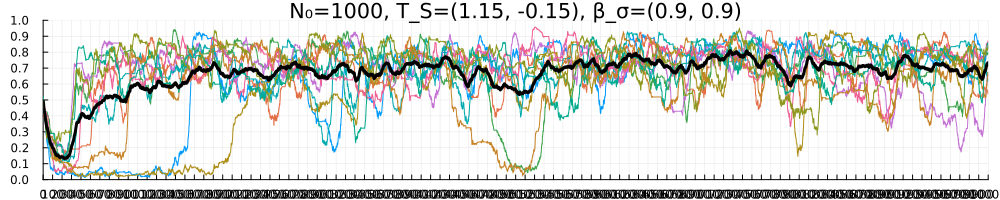

In [3]:
N_0_vec = [1_000]
T_S_vec = [(1.15, -0.15)]
β_σ_vec = [(0.0, 0.0), (0.1, 0.1), (0.8, 0.8), (0.9, 0.9)]
param_combinations = [(N_0, T_S, β_σ) for N_0 in N_0_vec, T_S in T_S_vec, β_σ in β_σ_vec]

Threads.@threads for (N_0, T_S, β_σ) in param_combinations
    param = Param(initial_N = N_0, T = T_S[1], S = T_S[2], β = β_σ[1], σ = β_σ[2], generations = 10_000)
    cooperation_rate_matrix = run(param)
    title = "N₀=$(N_0), T_S=$(T_S), β_σ=$(β_σ)"
    display(plot_time_series(cooperation_rate_matrix, title))
end;